#### =============================================================================
### Copyright 2025. Somjit Roy and Pritam Dey. 
### This program implements STARmap data study with the TAVIE algorithm as developed in:
### Roy, S., Dey, P., Pati, D., and Mallick, B.K.
### 'A Generalized Tangent Approximation Framework for Strongly Super-Gaussian Likelihoods',
### arXiv:2504.05431 <https://arxiv.org/abs/2504.05431>.
###
### Authors:
###   Somjit Roy (<sroy_123@tamu.edu>) and Pritam Dey (<pritam.dey@tamu.edu>)
#### =============================================================================

# STARmap data study

STARmap dataset: <https://lce.biohpc.swmed.edu/star/explorer.php> Primary Visual Cortex 160 genes.

Spatial transcriptomics refers to a collection of rapidly advancing technologies which allow researchers to study gene expressions and hence biological processes at various spatial resolutions. In comparison, traditional transcriptomic techniques combine the gene expressions in all cells in a sample. Spatial transcriptomics datasets typically consists of coordinates of spatial locations in a $2D$ tissue sample and the gene expression counts corresponding to several genes at each of the aforementioned spatial locations. In other words, the dataset consists of two matrices of size $n\times 2$ and $n\times G$ respectively which corresponds to $n$ locations in $2D$ space and $G$ genes observed at each location.

We considered the **STARmap (spatially-resolved transcript amplicon readout mapping)** dataset (<https://lce.biohpc.swmed.edu/star/explorer.php>, <https://www.science.org/doi/10.1126/science.aat5691>), which consists of data from $4$ mice. The experimental mice were dark housed for $4$ days and then either exposed to light or kept in the dark for another one hour before obtaining measurements from the primary visual cortex of each of the mouse brain. The data comprises of the expression of $160$ genes with the number of cells varying between from $931$ to $1167$ for the $4$ diferent mice. In the following study, we use the data corresponding to one of the above sample mice.

In [1]:
# Required imports
import numpy as np
import pandas as pd
import rdata
import matplotlib.pyplot as plt
from TAVIE import TAVIE_type_II
from CompetingMethods import *
from matplotlib.colors import TwoSlopeNorm
from tqdm import tqdm
from sklearn.preprocessing import SplineTransformer

### Reading the STARmap data

In [2]:
# reading the gene-expression counts and spatial locations
dataset = rdata.read_rds("data/STArMAP/STArMAP_Data.rds")
loc = pd.DataFrame(dataset['spatial_location'])
Y = pd.DataFrame(dataset['count'])

### Plotting the gene expressions across spatial locations

In [3]:
def plot_genes(genes, X, Y, nrow, ncol, cmap="Reds"):
    """
    This is a function to plot 30 genes of your own selection out of 160 genes

    Input:
        genes - is the selection of the genes that you want to plot.
        X - a pandas dataframe, containing two columns representing the 2D coordinates of the spatial locations
        Y - a pandas dataframe, where the columns represents the expressions of the genes
        nrow, ncol - the number of rows and columns in the plot window
        cmap - is the choice of the color map
    """
    # Create a 5×5 grid of subplots
    fig, axes = plt.subplots(nrow, ncol, figsize=(18, 18), constrained_layout=True)
    
    loc = X
    
    for ax, gene in zip(axes.flat, genes):
        # build a small DataFrame for this gene
        df = pd.DataFrame({
            'x': loc.iloc[:, 0].values,           # spatial X
            'y': loc.iloc[:, 1].values,           # spatial Y
            'expression': Y[gene].values         # gene expression
        })
        
        # scatter plot for this gene
        sc = ax.scatter(
            df['y'], df['x'],                   # or df['x'], df['y'] if you prefer
            c=df['expression'],
            cmap=cmap,
            s=20,
            edgecolor='none'
        )
        
        ax.set_aspect(1)                       # force 1:1 aspect ratio
        ax.set_title(f"{gene}", fontsize=9)
        ax.set_xticks([])                      # hide ticks for clarity
        ax.set_yticks([])
        
        # add an individual horizontal colorbar beneath this subplot
        cbar = fig.colorbar(
            sc,
            ax=ax,
            orientation='horizontal',
            fraction=0.04,     # width of colorbar relative to subplot
            pad=0.06           # space between plot and colorbar
        )
        cbar.ax.tick_params(labelsize=6)
    
    plt.show()

In [4]:
def plot_genes_common(genes, X, Y, nrow, ncol, cmap="Reds", common_cbar=False):
    """
    Plot selected genes on a spatial grid, either with individual color scales
    or a common color scale across all subplots (without Normalize).

    Inputs:
        genes        - list of gene names (columns of Y) to plot
        X            - pandas DataFrame with two columns: spatial coords
        Y            - pandas DataFrame of gene expression (columns = genes)
        nrow, ncol   - number of rows and columns in the plot grid
        cmap         - colormap name
        common_cbar  - bool; if True, use a single color scale (vmin/vmax) for all plots
                       and draw one shared colorbar; otherwise each subplot has its own.
    """
    # Precompute common vmin/vmax if requested
    if common_cbar:
        all_vals = np.concatenate([Y[gene].values for gene in genes])
        vmin, vmax = all_vals.min(), all_vals.max()
    else:
        vmin = vmax = None

    fig, axes = plt.subplots(nrow, ncol, figsize=(18, 18), constrained_layout=True)
    axes = axes.flat
    shared_scatter = None

    for ax, gene in zip(axes, genes):
        expr = Y[gene].values
        sc = ax.scatter(
            X.iloc[:,1], X.iloc[:,0],
            c=expr,
            cmap=cmap,
            vmin=vmin, vmax=vmax,
            s=20,
            edgecolor='none'
        )
        ax.set_aspect(1)
        ax.set_title(gene, fontsize=12)
        ax.set_xticks([]); ax.set_yticks([])
        if not common_cbar:
            cb = fig.colorbar(sc, ax=ax, orientation='horizontal',
                              fraction=0.04, pad=0.06)
            cb.ax.tick_params(labelsize=6)
        else:
            shared_scatter = sc  # keep last scatter for the shared colorbar

    # Turn off any extra axes
    for ax in axes[len(genes):]:
        ax.axis('off')

    if common_cbar and shared_scatter is not None:
        fig.colorbar(shared_scatter, ax=list(axes)[:len(genes)],
                     orientation='horizontal', fraction=0.02, pad=0.02)

    plt.show()


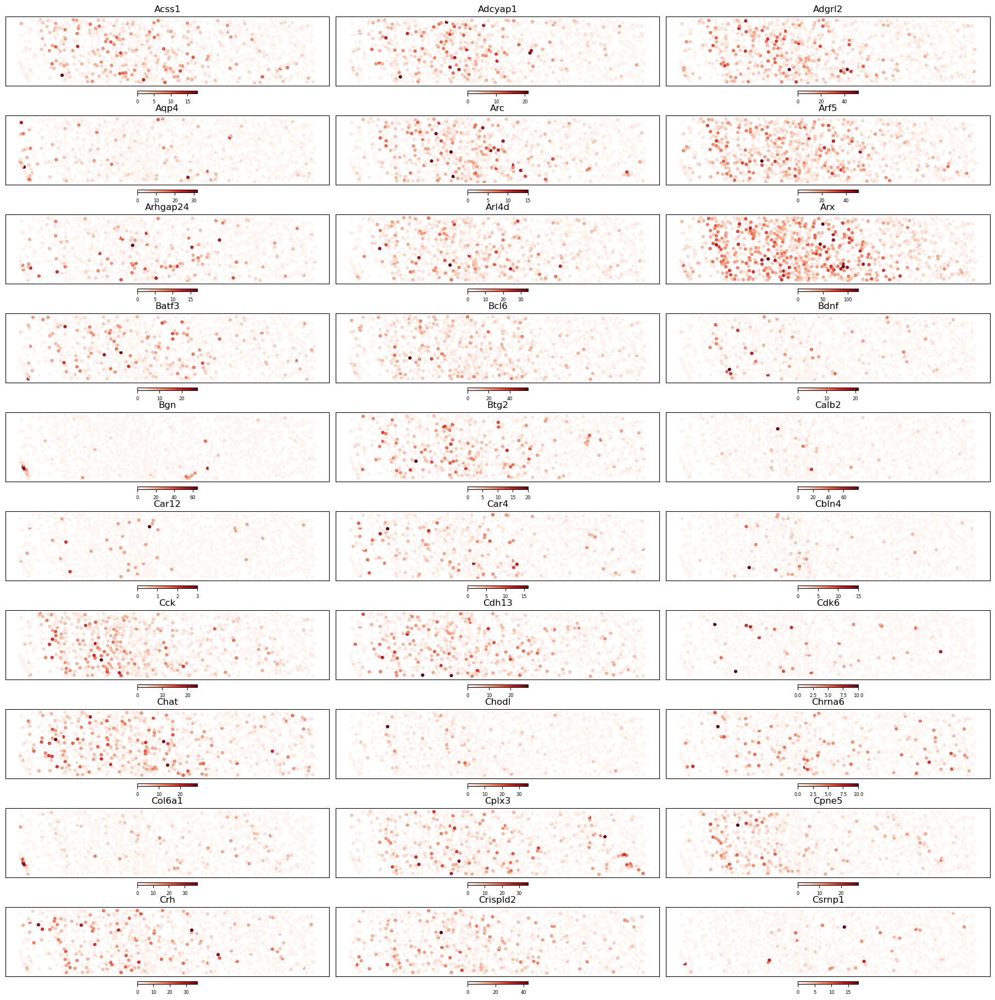

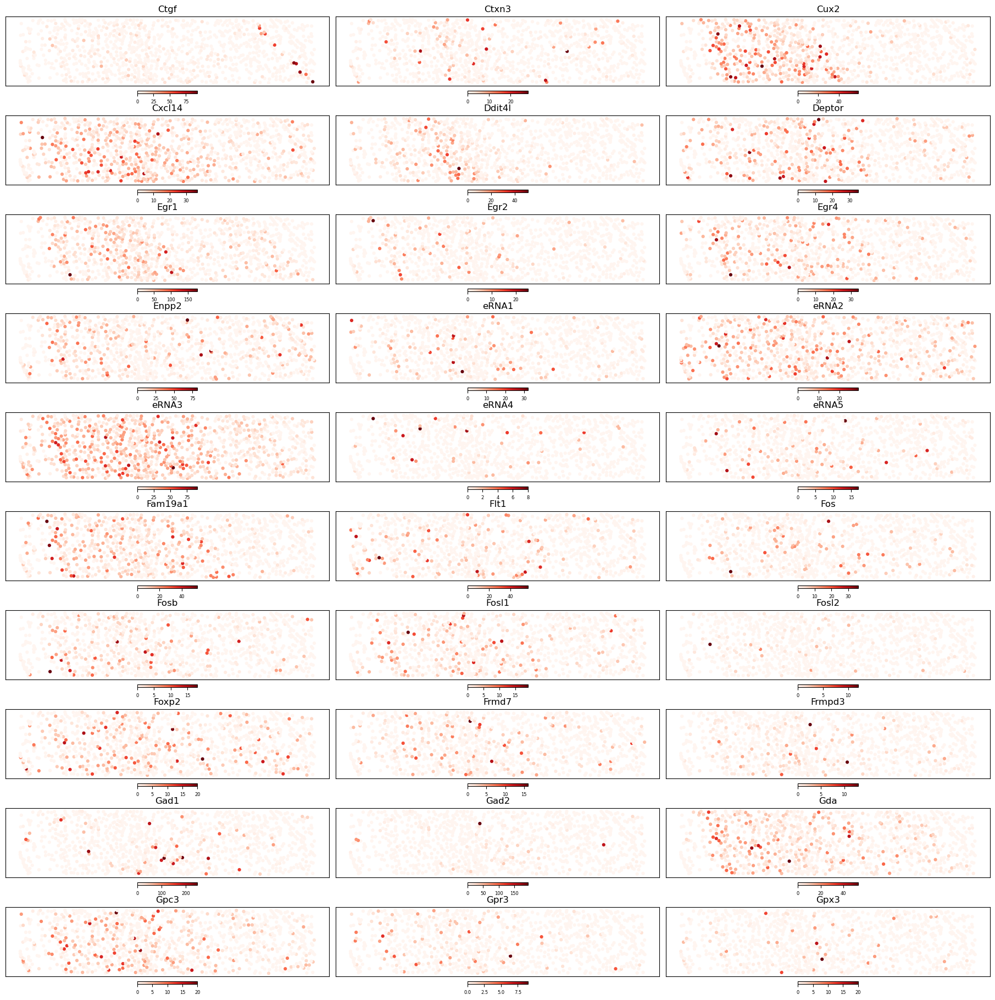

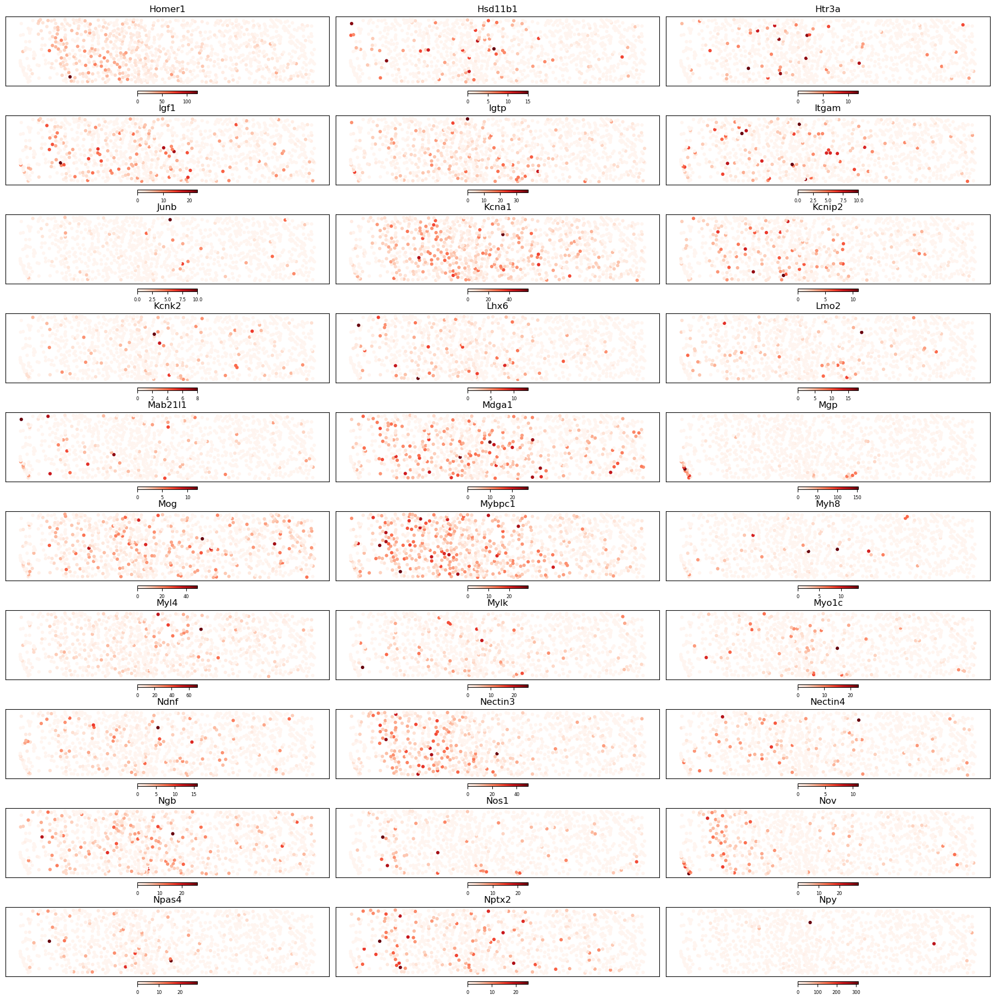

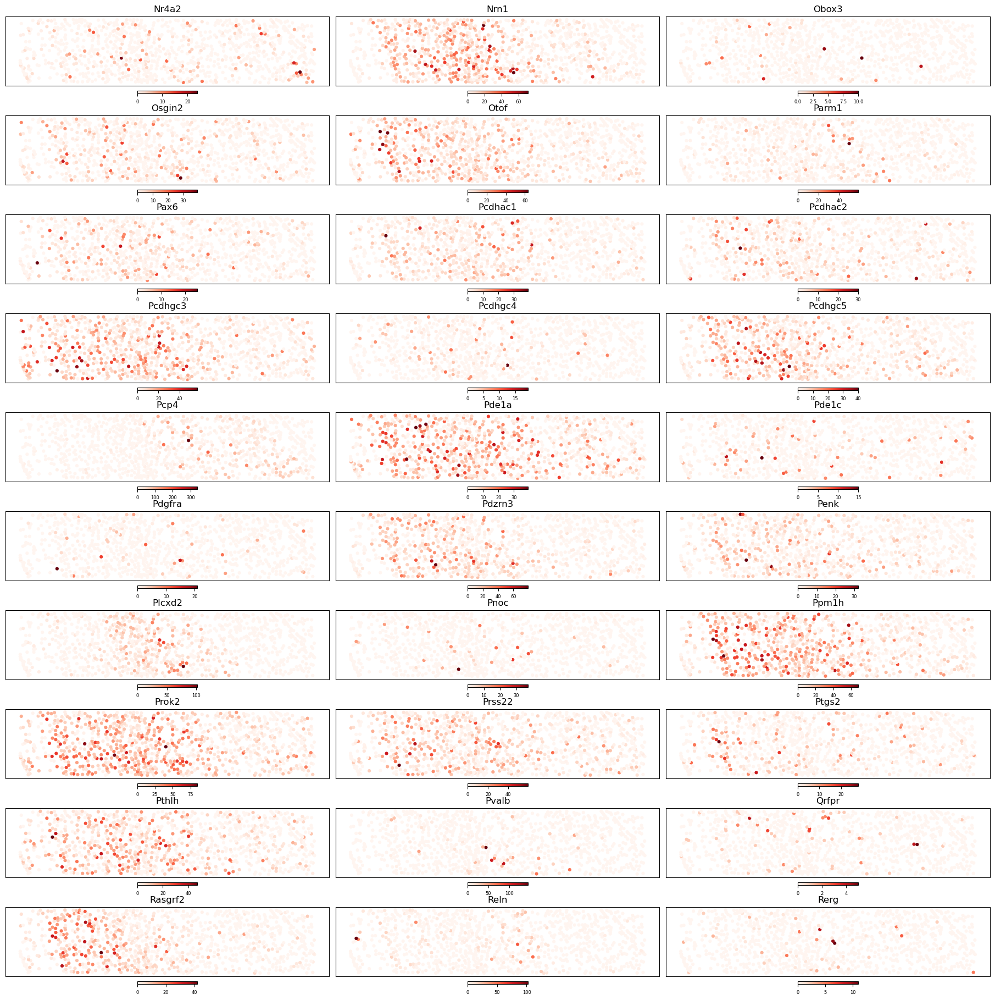

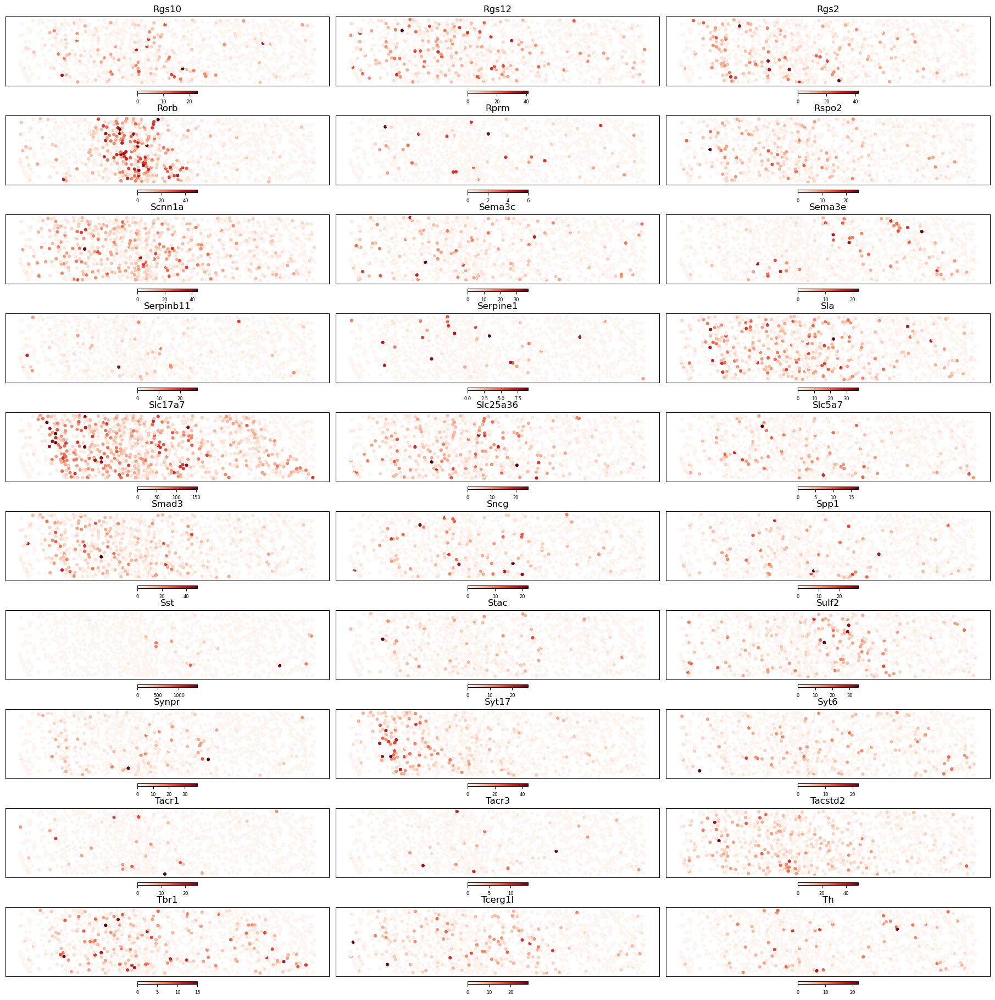

In [5]:
# Select the first 30 genes
genes1 = list(Y.columns[:30])
plot_genes_common(genes = genes1, X=loc, Y=Y, nrow = 10, ncol = 3)
# Select the next 30 genes
genes2 = list(Y.columns[30:60])
plot_genes_common(genes = genes2, X=loc, Y=Y, nrow = 10, ncol = 3)
# Select the next 30 genes
genes3 = list(Y.columns[60:90])
plot_genes_common(genes = genes3, X=loc, Y=Y, nrow = 10, ncol = 3)
# Select the next 30 genes
genes4 = list(Y.columns[90:120])
plot_genes_common(genes = genes4, X=loc, Y=Y, nrow = 10, ncol = 3)
# Select the next 30 genes
genes5 = list(Y.columns[120:150])
plot_genes_common(genes = genes5, X=loc, Y=Y, nrow = 10, ncol = 3)

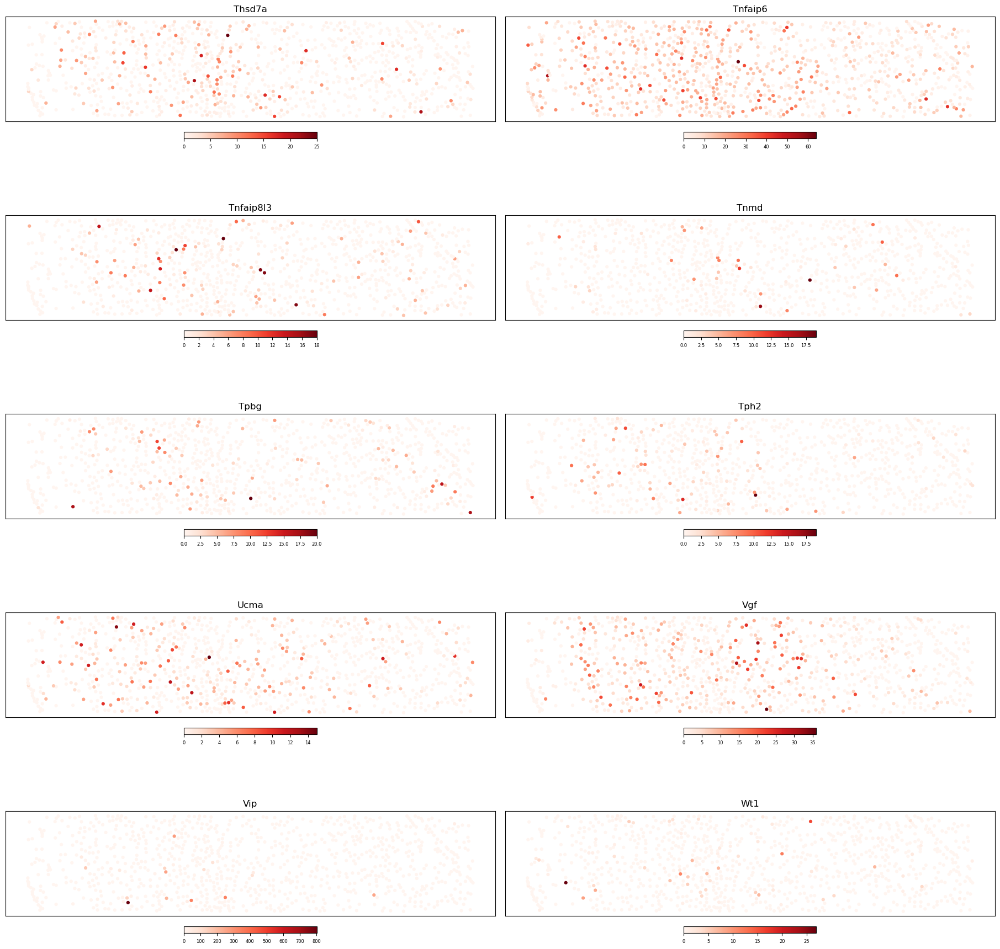

In [6]:
# Select the last 10 genes
genes6 = list(Y.columns[150:160])
plot_genes_common(genes = genes6, X=loc, Y=Y, nrow = 5, ncol = 2)

# What do we study? Problem Statement

Among the $160$ genes available to us in the above STARmap dataset, we want use the TAVIE negative-binomial framework to predict the various gene expressions.

We define the methodology in the following lines.
* First we transform the spatial locations in `loc` to basis functions evaluated at the spatial locations, using **cubic B-splines**.
* We use the TAVIE negative-binomial class to the fit the data.
* Pearson residuals are plotted to compare the accuracy of the fits across different gene expressions.
* We compare the TAVIE negative-binomial gene expression fits with predictions obtained from the BBVI module.

### Computing cubic B-spline functions at the spatial locations

In [5]:
# transforming spatial locations using cubic B-splines

def tensor_spline_basis(
    spatial_df: pd.DataFrame,
    n_knots_x: int,
    n_knots_y: int,
    degree: int = 3,
    include_bias: bool = False
) -> pd.DataFrame:
    """
    Build a tensor-product B-spline basis for 2D spatial coords.
    
    Parameters
    ----------
    spatial_df : DataFrame
        Two columns [x, y] of spatial coordinates.
    n_knots_x : int
        Number of interior knots for the x-dimension.
    n_knots_y : int
        Number of interior knots for the y-dimension.
    degree : int, default=3
        Spline degree (3 = cubic).
    include_bias : bool, default=False
        If True, include the constant basis; otherwise drop it.
    
    Returns
    -------
    X_df : DataFrame
        Tensor-product basis of shape (n_spots, n_basis_x * n_basis_y).
    """
    # 1) Extract x, y
    x = spatial_df.iloc[:, 0].values.reshape(-1, 1)
    y = spatial_df.iloc[:, 1].values.reshape(-1, 1)

    # 2) Build & fit marginal spline transformers
    sx = SplineTransformer(degree=degree, n_knots=n_knots_x,
                           include_bias=include_bias)
    sy = SplineTransformer(degree=degree, n_knots=n_knots_y,
                           include_bias=include_bias)
    Bx = sx.fit_transform(x)    # (n_samples, m_x)
    By = sy.fit_transform(y)    # (n_samples, m_y)

    # 3) Tensor-product: outer products per sample
    n, m_x = Bx.shape
    _, m_y = By.shape
    X_prod = (Bx[:, :, None] * By[:, None, :]).reshape(n, m_x * m_y)

    # 4) Build feature names
    names_x = sx.get_feature_names_out(['x'])
    names_y = sy.get_feature_names_out(['y'])
    feat_names = [f"{ix}*{iy}" for ix in names_x for iy in names_y]

    # 5) Return DataFrame
    return pd.DataFrame(X_prod, columns=feat_names)


# — example usage —
# use 2 knots in x, 8 knots in y; X_df has the basis locations
X_df = tensor_spline_basis(loc, n_knots_x=2, n_knots_y=8)
print("Basis shape:", X_df.shape)
X_df.head()

Basis shape: (941, 27)


,x_sp_0*y_sp_0,x_sp_0*y_sp_1,x_sp_0*y_sp_2,x_sp_0*y_sp_3,x_sp_0*y_sp_4,x_sp_0*y_sp_5,x_sp_0*y_sp_6,x_sp_0*y_sp_7,x_sp_0*y_sp_8,x_sp_1*y_sp_0,...,x_sp_1*y_sp_8,x_sp_2*y_sp_0,x_sp_2*y_sp_1,x_sp_2*y_sp_2,x_sp_2*y_sp_3,x_sp_2*y_sp_4,x_sp_2*y_sp_5,x_sp_2*y_sp_6,x_sp_2*y_sp_7,x_sp_2*y_sp_8
0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000166,0.044487,0.104206,0.0,...,0.424201,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000172,0.046076,0.107927
1,0.0,0.0,0.0,0.000000,0.000000,0.000021,0.035948,0.109806,0.020893,0.0,...,0.083571,0.0,0.0,0.0,0.000000,0.00000,0.000021,0.035948,0.109806,0.020893
2,0.0,0.0,0.0,0.004806,0.084575,0.072258,0.002324,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.0,0.004965,0.08738,0.074655,0.002401,0.000000,0.000000
3,0.0,0.0,0.0,0.000000,0.000000,0.000703,0.056575,0.097156,0.009571,0.0,...,0.038902,0.0,0.0,0.0,0.000000,0.00000,0.000726,0.058422,0.100327,0.009883
4,0.0,0.0,0.0,0.000000,0.000000,0.002080,0.070843,0.086615,0.005275,0.0,...,0.021335,0.0,0.0,0.0,0.000000,0.00000,0.002127,0.072443,0.088571,0.005394


### Plotting the basis functions

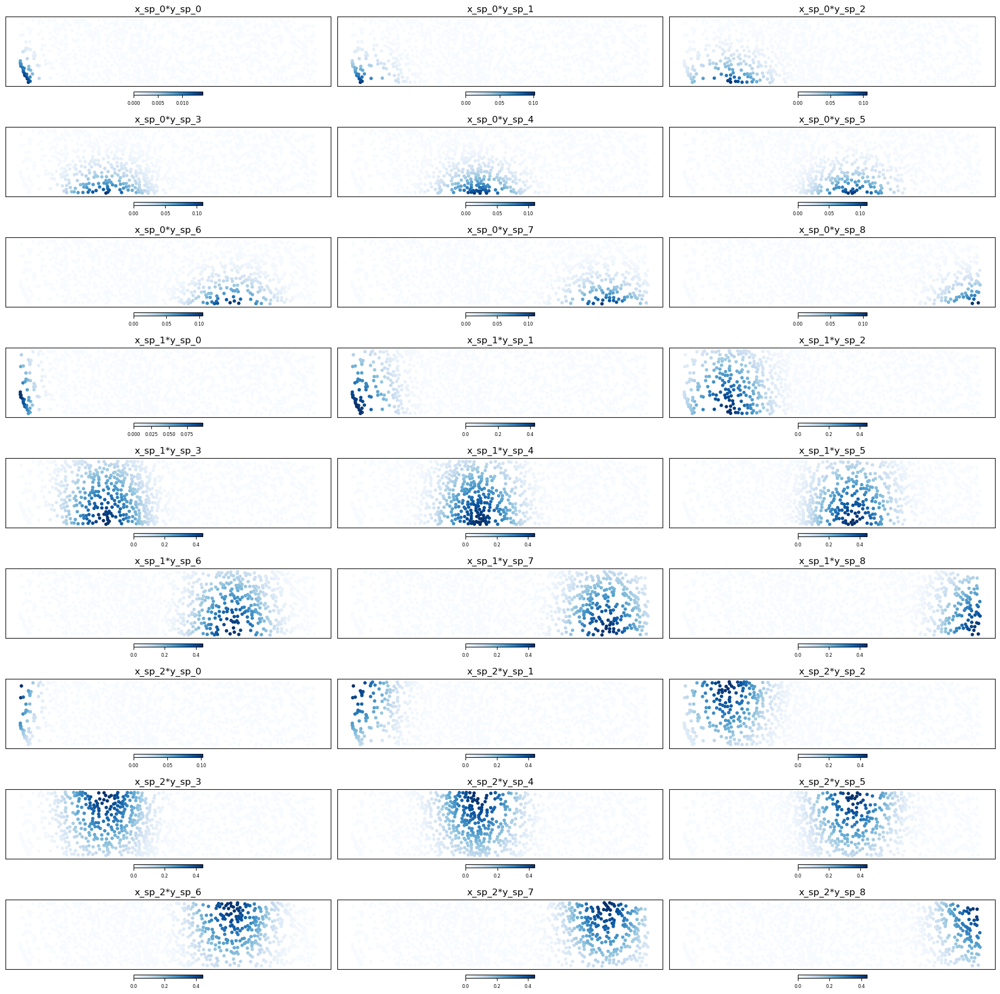

In [6]:
bases = list(X_df.columns)
plot_genes_common(genes = bases, X=loc, Y=X_df, nrow = 9, ncol = 3, cmap="Blues")

### Auxiliary functions

In [24]:
def predicted_mean_sd(beta, r, X):
    n = X.shape[0]
    X = np.column_stack((np.ones(n), X))
    p = 1 / (1 + np.exp(- X @ beta))
    mean = r * ((1 - p) / p)
    sd = np.sqrt(r * ((1 - p) / (p ** 2)))
    return mean, sd

def pearson_residual_nb(beta, r, X, y):
    mean, sd = predicted_mean_sd(beta=beta, r=r, X=X)
    return (y - mean) / sd

def residual_nb(beta, r, X, y):
    mean, sd = predicted_mean_sd(beta=beta, r=r, X=X)
    return (y - mean)

### Run and fit the TAVIE and BBVI Negative-Binomial model

In [8]:
# initialize the TAVIE model with the choice of Negative-Binomial SSG likelihood
STARmap_TAVIE_model = TAVIE_type_II(fit_intercept=True, family='negbin') # fitting an intercept

In [9]:
# converting to numpy array
Y_np = np.array(Y, dtype=np.float64)
X_np = np.array(X_df, dtype=np.float64)
X_np_bbvi = np.column_stack((np.ones(Y_np.shape[0]), X_np))

# building the r parameter in Negative-Binomial model
r = np.array(Y_np.sum(axis=1), dtype=np.float64)

In [26]:
# Fitting the TAVIE and BBVI Negative-Binomial model for all the genes, obtaining predicted gene expressions and Pearson residuals

n, p = X_np.shape
G     = Y_np.shape[1]

beta_tavie = np.zeros((p+1, G)) # to store the result of TAVIE estimates
beta_bbvi = np.zeros((p+1, G))  # to store the result of BBVI estimates
yhat_tavie = np.zeros(Y_np.shape) # to store the predicted gene expressions from TAVIE
yhat_bbvi = np.zeros(Y_np.shape) # to store the predicted gene expressions from BBVI
resid = np.zeros(Y_np.shape) # to store the Pearson residuals for TAVIE
resid_bbvi = np.zeros(Y_np.shape) # to store the Pearson residuals for BBVI
resid_normal = np.zeros(Y_np.shape) # to store the normal residuals for TAVIE
resid_normal_bbvi = np.zeros(Y_np.shape) # to store the normal residuals for BBVI

# developing initial prior parameters
m0 = np.zeros(p+1)
V0 = np.eye(p+1)
V0[0, 0] = 10
prior_params = [m0, V0]

for j in tqdm(range(G), desc="Gene"):
    y_j = Y_np[:, j]
    
    # fitting the TAVIE Negative-Binomial model
    STARmap_TAVIE_model.fit(X=X_np, y=y_j, r=r, prior_params=prior_params, maxiter = 10000, verbose=False)

    # getting the TAVIE estimate
    beta_j = STARmap_TAVIE_model.get_TAVIE_means(verbose=False)
    beta_tavie[:, j] = beta_j

    # getting the BBVI estimate
    beta_j_bbvi = BBVI_NegBin_patience(X_np_bbvi, y_j, r=r, tol=1e-3)
    beta_bbvi[:, j] = beta_j_bbvi['beta_mean']

    # predicted gene expressions for TAVIE
    yhat_tavie[:, j], _ = predicted_mean_sd(beta=beta_j, r=r, X=X_np)
    # predicted gene expressions for BBVI
    yhat_bbvi[:, j], _ = predicted_mean_sd(beta=beta_j_bbvi['beta_mean'], r=r, X=X_np)

    # Pearson residuals
    resid[:, j] = pearson_residual_nb(beta = beta_j, r=r, X=X_np, y=y_j)
    resid_bbvi[:, j] = pearson_residual_nb(beta = beta_j_bbvi['beta_mean'], r=r, X=X_np, y=y_j)

    # Normal residuals
    resid_normal[:, j] = residual_nb(beta = beta_j, r=r, X=X_np, y=y_j)
    resid_normal_bbvi[:, j] = residual_nb(beta = beta_j_bbvi['beta_mean'], r=r, X=X_np, y=y_j)

Gene:   1%|▏                                    | 1/160 [00:00<02:24,  1.10it/s]

Early stopping at iter 1936: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   1%|▍                                    | 2/160 [00:01<02:09,  1.22it/s]

Early stopping at iter 1237: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   2%|▋                                    | 3/160 [00:02<02:20,  1.11it/s]

Early stopping at iter 2761: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   2%|▉                                    | 4/160 [00:04<02:56,  1.13s/it]

Early stopping at iter 3516: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   3%|█▏                                   | 5/160 [00:05<02:42,  1.05s/it]

Early stopping at iter 2036: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   4%|█▍                                   | 6/160 [00:05<02:17,  1.12it/s]

Early stopping at iter 1421: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   4%|█▌                                   | 7/160 [00:06<02:34,  1.01s/it]

Early stopping at iter 2391: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   5%|█▊                                   | 8/160 [00:07<02:11,  1.16it/s]

Early stopping at iter 1171: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   6%|██                                   | 9/160 [00:08<02:06,  1.20it/s]

Early stopping at iter 2320: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   6%|██▎                                 | 10/160 [00:09<02:05,  1.19it/s]

Early stopping at iter 1697: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   7%|██▍                                 | 11/160 [00:09<01:49,  1.36it/s]

Early stopping at iter 1207: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   8%|██▋                                 | 12/160 [00:11<02:24,  1.03it/s]

Early stopping at iter 2096: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   8%|██▉                                 | 13/160 [00:14<04:15,  1.74s/it]

Early stopping at iter 6713: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   9%|███▏                                | 14/160 [00:15<03:37,  1.49s/it]

Early stopping at iter 1779: no ELBO gain ≥ 0.001 for 500 iters.


Gene:   9%|███▍                                | 15/160 [00:16<03:24,  1.41s/it]

Early stopping at iter 2540: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  10%|███▌                                | 16/160 [00:21<05:51,  2.44s/it]

Early stopping at iter 2277: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  11%|███▊                                | 17/160 [00:23<05:11,  2.18s/it]

Early stopping at iter 3643: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  11%|████                                | 18/160 [00:25<05:21,  2.26s/it]

Early stopping at iter 3533: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  12%|████▎                               | 19/160 [00:26<04:08,  1.76s/it]

Early stopping at iter 1150: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  12%|████▌                               | 20/160 [00:26<03:23,  1.45s/it]

Early stopping at iter 1506: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  13%|████▋                               | 21/160 [00:29<03:49,  1.65s/it]

Early stopping at iter 2904: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  14%|████▉                               | 22/160 [00:29<03:09,  1.37s/it]

Early stopping at iter 1768: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  14%|█████▏                              | 23/160 [00:30<02:55,  1.28s/it]

Early stopping at iter 1785: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  15%|█████▍                              | 24/160 [00:32<03:00,  1.33s/it]

Early stopping at iter 2656: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  16%|█████▋                              | 25/160 [00:33<02:56,  1.31s/it]

Early stopping at iter 2225: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  16%|█████▊                              | 26/160 [00:34<02:27,  1.10s/it]

Early stopping at iter 1284: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  17%|██████                              | 27/160 [00:35<02:37,  1.19s/it]

Early stopping at iter 2821: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  18%|██████▎                             | 28/160 [00:36<02:21,  1.07s/it]

Early stopping at iter 2000: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  18%|██████▌                             | 29/160 [00:37<02:11,  1.01s/it]

Early stopping at iter 2212: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  19%|██████▊                             | 30/160 [00:39<02:48,  1.29s/it]

Early stopping at iter 2236: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  19%|██████▉                             | 31/160 [00:40<03:00,  1.40s/it]

Early stopping at iter 4508: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  20%|███████▏                            | 32/160 [00:42<03:00,  1.41s/it]

Early stopping at iter 2866: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  21%|███████▍                            | 33/160 [00:43<03:06,  1.47s/it]

Early stopping at iter 4043: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  21%|███████▋                            | 34/160 [00:44<02:31,  1.20s/it]

Early stopping at iter 1276: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  22%|███████▉                            | 35/160 [00:45<02:29,  1.20s/it]

Early stopping at iter 2399: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  22%|████████                            | 36/160 [00:46<02:15,  1.10s/it]

Early stopping at iter 1887: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  24%|████████▌                           | 38/160 [00:50<03:16,  1.61s/it]

Early stopping at iter 1932: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  24%|████████▊                           | 39/160 [00:51<02:47,  1.38s/it]

Early stopping at iter 1855: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  25%|█████████                           | 40/160 [00:53<02:48,  1.41s/it]

Early stopping at iter 4175: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  26%|█████████▏                          | 41/160 [00:54<02:24,  1.21s/it]

Early stopping at iter 1167: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  26%|█████████▍                          | 42/160 [00:54<02:05,  1.07s/it]

Early stopping at iter 1771: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  27%|█████████▋                          | 43/160 [00:55<01:49,  1.07it/s]

Early stopping at iter 1858: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  28%|█████████▉                          | 44/160 [00:58<03:03,  1.59s/it]

Early stopping at iter 4512: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  28%|██████████▏                         | 45/160 [00:59<02:48,  1.46s/it]

Early stopping at iter 1773: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  29%|██████████▎                         | 46/160 [01:00<02:24,  1.26s/it]

Early stopping at iter 1864: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  29%|██████████▌                         | 47/160 [01:01<02:25,  1.29s/it]

Early stopping at iter 3680: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  30%|██████████▊                         | 48/160 [01:02<02:16,  1.22s/it]

Early stopping at iter 1783: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  31%|███████████                         | 49/160 [01:04<02:13,  1.20s/it]

Early stopping at iter 2041: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  31%|███████████▎                        | 50/160 [01:04<02:01,  1.10s/it]

Early stopping at iter 1172: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  32%|███████████▍                        | 51/160 [01:08<03:06,  1.71s/it]

Early stopping at iter 3020: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  32%|███████████▋                        | 52/160 [01:09<02:46,  1.54s/it]

Early stopping at iter 2412: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  33%|███████████▉                        | 53/160 [01:10<02:26,  1.37s/it]

Early stopping at iter 1196: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  34%|████████████▏                       | 54/160 [01:11<02:34,  1.46s/it]

Early stopping at iter 2303: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  34%|████████████▍                       | 55/160 [01:12<02:09,  1.24s/it]

Early stopping at iter 1712: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  35%|████████████▌                       | 56/160 [01:13<02:01,  1.17s/it]

Early stopping at iter 1671: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  36%|████████████▊                       | 57/160 [01:15<02:14,  1.30s/it]

Early stopping at iter 3743: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  36%|█████████████                       | 58/160 [01:15<01:57,  1.15s/it]

Early stopping at iter 1672: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  37%|█████████████▎                      | 59/160 [01:17<02:18,  1.37s/it]

Early stopping at iter 2021: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  38%|█████████████▌                      | 60/160 [01:19<02:25,  1.46s/it]

Early stopping at iter 2167: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  38%|█████████████▋                      | 61/160 [01:20<01:59,  1.20s/it]

Early stopping at iter 1500: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  39%|█████████████▉                      | 62/160 [01:21<02:03,  1.26s/it]

Early stopping at iter 2066: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  39%|██████████████▏                     | 63/160 [01:23<02:21,  1.46s/it]

Early stopping at iter 2779: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  40%|██████████████▍                     | 64/160 [01:24<02:05,  1.30s/it]

Early stopping at iter 2162: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  41%|██████████████▋                     | 65/160 [01:25<01:45,  1.11s/it]

Early stopping at iter 1274: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  41%|██████████████▊                     | 66/160 [01:26<01:53,  1.21s/it]

Early stopping at iter 2415: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  42%|███████████████                     | 67/160 [01:29<02:35,  1.68s/it]

Early stopping at iter 2920: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  42%|███████████████▎                    | 68/160 [01:30<02:10,  1.41s/it]

Early stopping at iter 2166: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  43%|███████████████▌                    | 69/160 [01:31<02:08,  1.41s/it]

Early stopping at iter 2079: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  44%|███████████████▊                    | 70/160 [01:33<02:35,  1.73s/it]

Early stopping at iter 3215: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  44%|███████████████▉                    | 71/160 [01:35<02:24,  1.62s/it]

Early stopping at iter 1674: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  45%|████████████████▏                   | 72/160 [01:37<02:33,  1.74s/it]

Early stopping at iter 4038: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  46%|████████████████▍                   | 73/160 [01:38<02:24,  1.66s/it]

Early stopping at iter 1370: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  46%|████████████████▋                   | 74/160 [01:39<01:59,  1.39s/it]

Early stopping at iter 1798: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  47%|████████████████▉                   | 75/160 [01:42<02:48,  1.98s/it]

Early stopping at iter 9479: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  48%|█████████████████                   | 76/160 [01:43<02:13,  1.59s/it]

Early stopping at iter 1660: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  48%|█████████████████▎                  | 77/160 [01:44<02:02,  1.47s/it]

Early stopping at iter 3325: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  49%|█████████████████▌                  | 78/160 [01:46<02:08,  1.56s/it]

Early stopping at iter 1436: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  49%|█████████████████▊                  | 79/160 [01:47<01:44,  1.29s/it]

Early stopping at iter 1413: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  50%|██████████████████                  | 80/160 [01:48<01:38,  1.23s/it]

Early stopping at iter 2124: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  51%|██████████████████▏                 | 81/160 [01:49<01:43,  1.31s/it]

Early stopping at iter 2778: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  51%|██████████████████▍                 | 82/160 [01:51<01:44,  1.34s/it]

Early stopping at iter 2783: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  52%|██████████████████▋                 | 83/160 [01:51<01:28,  1.15s/it]

Early stopping at iter 1410: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  52%|██████████████████▉                 | 84/160 [01:53<01:38,  1.29s/it]

Early stopping at iter 2228: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  53%|███████████████████▏                | 85/160 [01:54<01:26,  1.15s/it]

Early stopping at iter 1690: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  54%|███████████████████▎                | 86/160 [01:55<01:28,  1.20s/it]

Early stopping at iter 1427: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  54%|███████████████████▌                | 87/160 [01:56<01:26,  1.19s/it]

Early stopping at iter 1571: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  55%|███████████████████▊                | 88/160 [01:58<01:30,  1.26s/it]

Early stopping at iter 2572: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  56%|████████████████████                | 89/160 [01:59<01:19,  1.13s/it]

Early stopping at iter 1285: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  56%|████████████████████▎               | 90/160 [02:00<01:25,  1.22s/it]

Early stopping at iter 3854: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  57%|████████████████████▍               | 91/160 [02:01<01:25,  1.24s/it]

Early stopping at iter 2641: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  57%|████████████████████▋               | 92/160 [02:02<01:12,  1.07s/it]

Early stopping at iter 1371: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  58%|████████████████████▉               | 93/160 [02:05<01:54,  1.71s/it]

Early stopping at iter 2157: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  59%|█████████████████████▏              | 94/160 [02:06<01:42,  1.55s/it]

Early stopping at iter 2487: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  59%|█████████████████████▍              | 95/160 [02:07<01:25,  1.31s/it]

Early stopping at iter 1409: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  60%|█████████████████████▌              | 96/160 [02:08<01:18,  1.22s/it]

Early stopping at iter 2049: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  61%|█████████████████████▊              | 97/160 [02:10<01:20,  1.29s/it]

Early stopping at iter 3289: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  61%|██████████████████████              | 98/160 [02:10<01:12,  1.17s/it]

Early stopping at iter 1806: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  62%|██████████████████████▎             | 99/160 [02:12<01:16,  1.25s/it]

Early stopping at iter 3164: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  62%|█████████████████████▉             | 100/160 [02:12<01:01,  1.03s/it]

Early stopping at iter 1260: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  63%|██████████████████████             | 101/160 [02:14<01:09,  1.18s/it]

Early stopping at iter 1967: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  64%|██████████████████████▎            | 102/160 [02:15<01:11,  1.23s/it]

Early stopping at iter 3831: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  64%|██████████████████████▌            | 103/160 [02:17<01:21,  1.44s/it]

Early stopping at iter 4557: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  65%|██████████████████████▊            | 104/160 [02:18<01:09,  1.24s/it]

Early stopping at iter 1764: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  66%|██████████████████████▉            | 105/160 [02:20<01:19,  1.44s/it]

Early stopping at iter 2160: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  66%|███████████████████████▏           | 106/160 [02:22<01:26,  1.60s/it]

Early stopping at iter 3112: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  67%|███████████████████████▍           | 107/160 [02:22<01:08,  1.29s/it]

Early stopping at iter 1079: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  68%|███████████████████████▋           | 108/160 [02:23<00:57,  1.10s/it]

Early stopping at iter 1164: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  68%|███████████████████████▊           | 109/160 [02:25<01:09,  1.35s/it]

Early stopping at iter 4084: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  69%|████████████████████████           | 110/160 [02:27<01:10,  1.41s/it]

Early stopping at iter 1779: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  69%|████████████████████████▎          | 111/160 [02:28<01:03,  1.29s/it]

Early stopping at iter 2875: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  70%|████████████████████████▌          | 112/160 [02:28<00:49,  1.03s/it]

Early stopping at iter 997: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  71%|████████████████████████▋          | 113/160 [02:28<00:39,  1.20it/s]

Early stopping at iter 757: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  71%|████████████████████████▉          | 114/160 [02:29<00:38,  1.19it/s]

Early stopping at iter 1442: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  72%|█████████████████████████▏         | 115/160 [02:30<00:33,  1.36it/s]

Early stopping at iter 1084: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  72%|█████████████████████████▍         | 116/160 [02:31<00:42,  1.03it/s]

Early stopping at iter 2730: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  73%|█████████████████████████▌         | 117/160 [02:34<01:09,  1.63s/it]

Early stopping at iter 2674: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  74%|█████████████████████████▊         | 118/160 [02:36<01:02,  1.50s/it]

Early stopping at iter 2962: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  74%|██████████████████████████         | 119/160 [02:37<01:03,  1.54s/it]

Early stopping at iter 3716: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  75%|██████████████████████████▎        | 120/160 [02:40<01:19,  1.99s/it]

Early stopping at iter 2968: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  76%|██████████████████████████▍        | 121/160 [02:41<01:05,  1.68s/it]

Early stopping at iter 1752: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  76%|██████████████████████████▋        | 122/160 [02:42<00:54,  1.43s/it]

Early stopping at iter 2046: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  77%|██████████████████████████▉        | 123/160 [02:43<00:48,  1.31s/it]

Early stopping at iter 2338: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  78%|███████████████████████████▏       | 124/160 [02:44<00:47,  1.31s/it]

Early stopping at iter 2906: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  78%|███████████████████████████▎       | 125/160 [02:47<01:02,  1.79s/it]

Early stopping at iter 2551: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  79%|███████████████████████████▌       | 126/160 [02:48<00:51,  1.52s/it]

Early stopping at iter 1515: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  79%|███████████████████████████▊       | 127/160 [02:49<00:39,  1.21s/it]

Early stopping at iter 995: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  80%|████████████████████████████       | 128/160 [02:50<00:34,  1.09s/it]

Early stopping at iter 1270: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  81%|████████████████████████████▏      | 129/160 [02:51<00:40,  1.30s/it]

Early stopping at iter 2675: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  81%|████████████████████████████▍      | 130/160 [02:53<00:38,  1.28s/it]

Early stopping at iter 1781: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  82%|████████████████████████████▋      | 131/160 [02:55<00:46,  1.59s/it]

Early stopping at iter 2295: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  82%|████████████████████████████▉      | 132/160 [02:55<00:36,  1.30s/it]

Early stopping at iter 1492: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  83%|█████████████████████████████      | 133/160 [02:57<00:36,  1.33s/it]

Early stopping at iter 4336: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  84%|█████████████████████████████▎     | 134/160 [02:58<00:30,  1.15s/it]

Early stopping at iter 1384: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  84%|█████████████████████████████▌     | 135/160 [02:59<00:28,  1.14s/it]

Early stopping at iter 1736: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  85%|█████████████████████████████▊     | 136/160 [02:59<00:23,  1.01it/s]

Early stopping at iter 1258: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  86%|█████████████████████████████▉     | 137/160 [03:01<00:24,  1.05s/it]

Early stopping at iter 2398: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  86%|██████████████████████████████▏    | 138/160 [03:02<00:24,  1.10s/it]

Early stopping at iter 2496: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  88%|██████████████████████████████▋    | 140/160 [03:07<00:34,  1.71s/it]

Early stopping at iter 2456: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  88%|██████████████████████████████▊    | 141/160 [03:08<00:29,  1.56s/it]

Early stopping at iter 2702: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  89%|███████████████████████████████    | 142/160 [03:09<00:24,  1.38s/it]

Early stopping at iter 1413: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  89%|███████████████████████████████▎   | 143/160 [03:10<00:20,  1.22s/it]

Early stopping at iter 1546: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  90%|███████████████████████████████▌   | 144/160 [03:11<00:18,  1.19s/it]

Early stopping at iter 1914: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  91%|███████████████████████████████▋   | 145/160 [03:13<00:22,  1.49s/it]

Early stopping at iter 2378: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  91%|███████████████████████████████▉   | 146/160 [03:16<00:24,  1.78s/it]

Early stopping at iter 1967: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  92%|████████████████████████████████▏  | 147/160 [03:16<00:19,  1.49s/it]

Early stopping at iter 1554: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  92%|████████████████████████████████▍  | 148/160 [03:18<00:17,  1.43s/it]

Early stopping at iter 2623: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  93%|████████████████████████████████▌  | 149/160 [03:19<00:14,  1.33s/it]

Early stopping at iter 2331: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  94%|████████████████████████████████▊  | 150/160 [03:20<00:13,  1.33s/it]

Early stopping at iter 1912: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  94%|█████████████████████████████████  | 151/160 [03:21<00:11,  1.25s/it]

Early stopping at iter 1921: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  95%|█████████████████████████████████▎ | 152/160 [03:22<00:08,  1.00s/it]

Early stopping at iter 931: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  96%|█████████████████████████████████▍ | 153/160 [03:23<00:07,  1.12s/it]

Early stopping at iter 1828: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  96%|█████████████████████████████████▋ | 154/160 [03:25<00:09,  1.51s/it]

Early stopping at iter 1434: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  97%|█████████████████████████████████▉ | 155/160 [03:27<00:07,  1.53s/it]

Early stopping at iter 1918: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  98%|██████████████████████████████████▏| 156/160 [03:29<00:06,  1.68s/it]

Early stopping at iter 2698: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  98%|██████████████████████████████████▎| 157/160 [03:30<00:04,  1.58s/it]

Early stopping at iter 2631: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  99%|██████████████████████████████████▌| 158/160 [03:31<00:02,  1.42s/it]

Early stopping at iter 1644: no ELBO gain ≥ 0.001 for 500 iters.


Gene:  99%|██████████████████████████████████▊| 159/160 [03:32<00:01,  1.23s/it]

Early stopping at iter 818: no ELBO gain ≥ 0.001 for 500 iters.


Gene: 100%|███████████████████████████████████| 160/160 [03:35<00:00,  1.35s/it]

Early stopping at iter 2670: no ELBO gain ≥ 0.001 for 500 iters.


### Plot of true versus TAVIE and BBVI predicted gene expressions

In [27]:
Y_all = np.zeros((Y_np.shape[0], 3*Y_np.shape[1]))
Y_all[:, 3*np.arange(Y_np.shape[1])] = Y_np
Y_all[:, (3*np.arange(Y_np.shape[1]) + 1)] = yhat_tavie
Y_all[:, (3*np.arange(Y_np.shape[1]) + 2)] = yhat_bbvi

genes_names = Y.columns.tolist()
Y_all_names = []
for g in genes_names:
    Y_all_names += [str(g), f"{g}.TAVIE.pred", f"{g}.BBVI.pred"]

Y_all = pd.DataFrame(Y_all, columns=Y_all_names)

#### Plotting true and TAVIE fitted gene-expressions for some genes

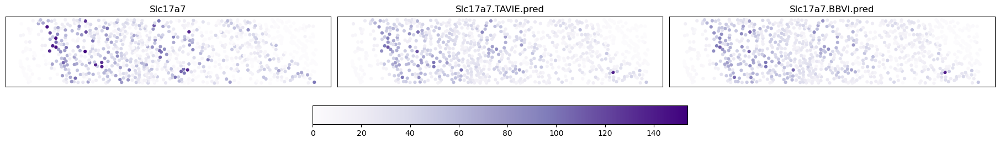

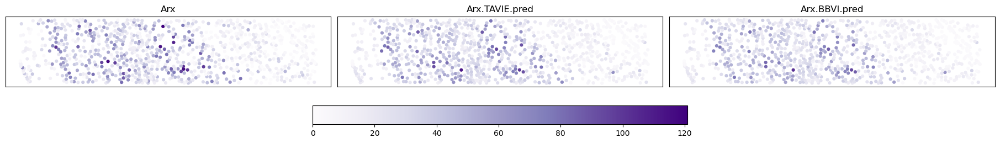

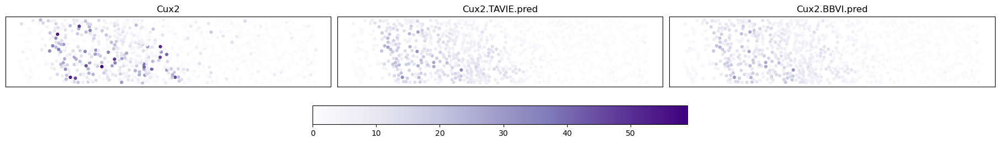

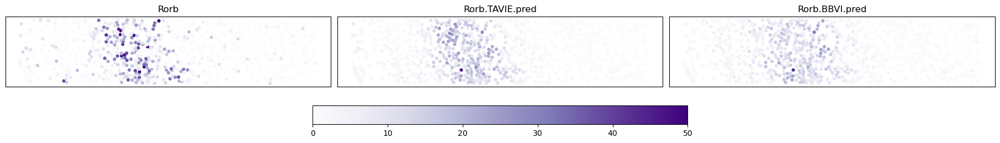

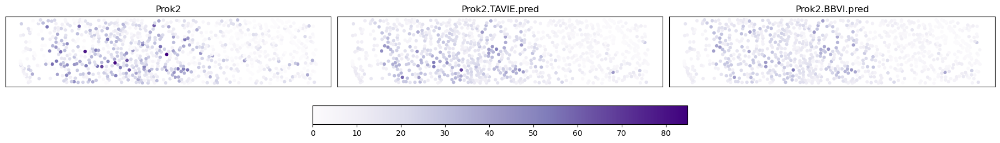

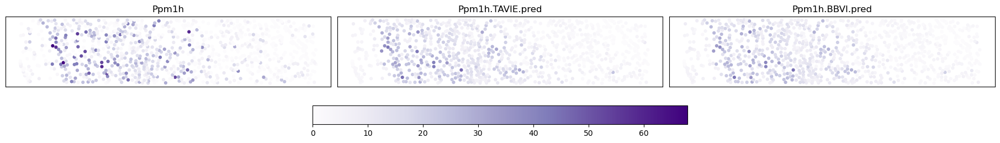

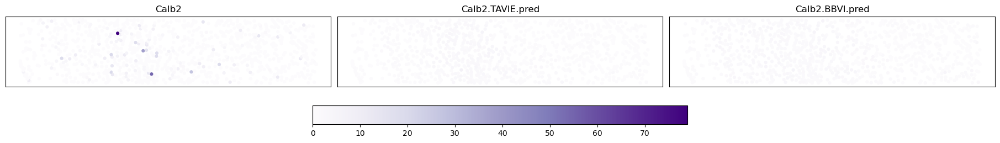

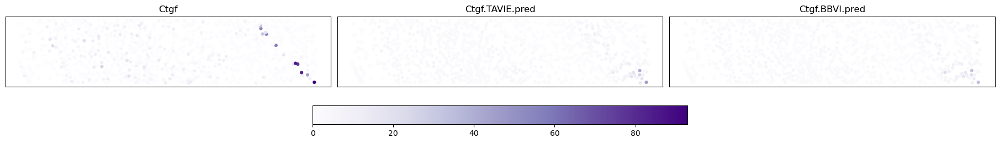

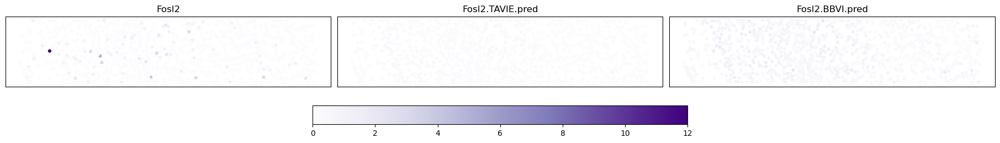

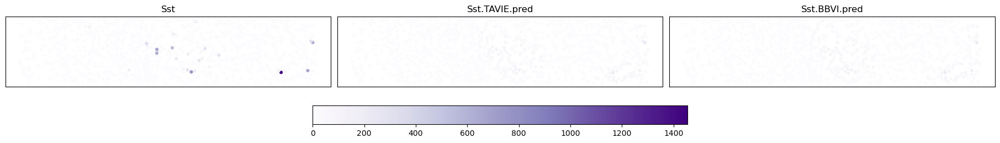

In [29]:
## For gene 'Slc17a7'
gene_no = 132
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Arx'
gene_no = 8
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Cux2'
gene_no = 32
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Rorb'
gene_no = 123
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Prok2'
gene_no = 111
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Ppm1h'
gene_no = 110
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Calb2'
gene_no = 14
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Ctgf'
gene_no = 30
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

## For gene 'Fosl2'
gene_no = 50
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

gene_no = 138
genes = list(Y_all.columns[(3*gene_no):(3*gene_no + 3)])
plot_genes_common(genes = genes, X=loc, Y=Y_all, nrow = 1, ncol = 3, cmap = "Purples", common_cbar=True)

#### Plotting the Pearson residuals for the TAVIE gene expression fit

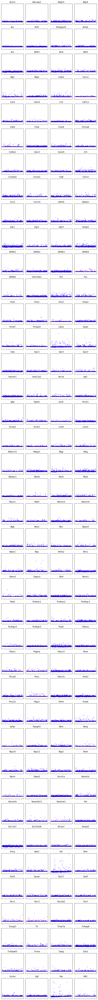

In [30]:
resid_df = pd.DataFrame(resid, columns = Y.columns)

n_vars = resid_df.shape[1]
ncols = 4
nrows = int(np.ceil(n_vars / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2, nrows*2), sharex=True, sharey=True)
axes = axes.flatten()

for ax, col in zip(axes, resid_df.columns):
    ax.scatter(resid_df.index, resid_df[col], s=5, color='blue', alpha=0.5)
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5)
    ax.set_title(col, fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])

# Turn off any unused subplots
for ax in axes[n_vars:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

### Comparison with BBVI module based on Pearson residuals

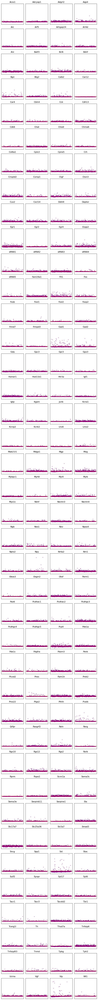

In [17]:
resid_df = pd.DataFrame(resid_bbvi, columns = Y.columns)

n_vars = resid_df.shape[1]
ncols = 4
nrows = int(np.ceil(n_vars / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2, nrows*2), sharex=True, sharey=True)
axes = axes.flatten()

for ax, col in zip(axes, resid_df.columns):
    ax.scatter(resid_df.index, resid_df[col], s=5, color='purple', alpha=0.5)
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5)
    ax.set_title(col, fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])

# Turn off any unused subplots
for ax in axes[n_vars:]:
    ax.axis("off")

plt.tight_layout()
plt.show()

### Comparing the RSS of TAVIE and BBVI for each gene expressions

In [31]:
RSS_tavie = np.sum(resid_normal ** 2, axis=0)
RSS_bbvi = np.sum(resid_normal_bbvi ** 2, axis=0)

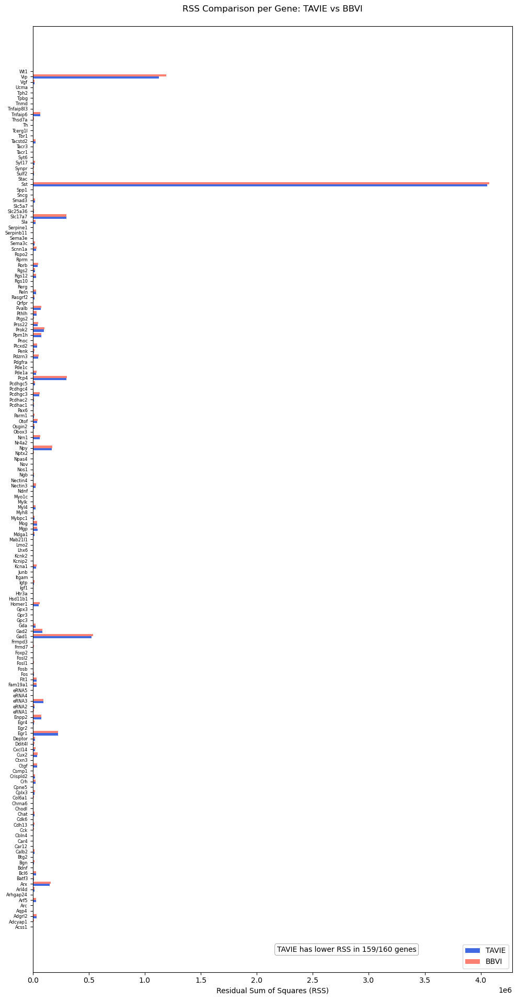

In [34]:
count_lower = np.sum(RSS_tavie < RSS_bbvi)
G = len(RSS_tavie)

# 3) Gene names and bar positions
genes = resid_df.columns.tolist()
y_pos = np.arange(G)
height = 0.4

# 4) Plot grouped horizontal bars
fig, ax = plt.subplots(figsize=(10, G*0.12))
ax.barh(y_pos - height/2, RSS_tavie, height=height, color='royalblue', label='TAVIE')
ax.barh(y_pos + height/2, RSS_bbvi,  height=height, color='salmon',     label='BBVI')

# 5) Labels and aesthetics
ax.set_yticks(y_pos)
ax.set_yticklabels(genes, fontsize=6)
ax.set_xlabel('Residual Sum of Squares (RSS)')
ax.set_title('RSS Comparison per Gene: TAVIE vs BBVI', pad=20)
ax.legend(loc='lower right', fontsize=10)

# 6) Annotate count of genes where TAVIE performs better
ax.text(
    0.80, 0.02,
    f"TAVIE has lower RSS in {count_lower}/{G} genes",
    transform=ax.transAxes,
    ha='right',
    va='bottom',
    fontsize=10,
    color='black',
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.5)
)

plt.tight_layout()
plt.show()